<a href="https://www.kaggle.com/code/mdebrahimhossen/cv-task?scriptVersionId=177631168" target="_blank"><img align="left" alt="Kaggle" title="Open in Kaggle" src="https://kaggle.com/static/images/open-in-kaggle.svg"></a>

In [1]:
!pip install stardist scikit-image matplotlib

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.1/3.1 MB 19.6 MB/s eta 0:00:0000:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 71.3/71.3 kB 5.0 MB/s eta 0:00:00


# **Procedure to Run and summary :**

1. I create dataset from your provided image that names orginal and add in kaggle.

2. Firstly, I used watershed method to find segmentation neuclei with draw polygoan.

3. Secondly , I used StartDist2D method to find segmentation neuclei.

4. Thirdly , I Used watershed method and find the neuclei with red circle drawn.

5. Fourthly, I create a custom u-net CNN model and predict the neuclei segmentation.

6. Fivthly, I create same CNN model and used data augmentation and predict the neuclei.

# using watershed method and draw polygoan

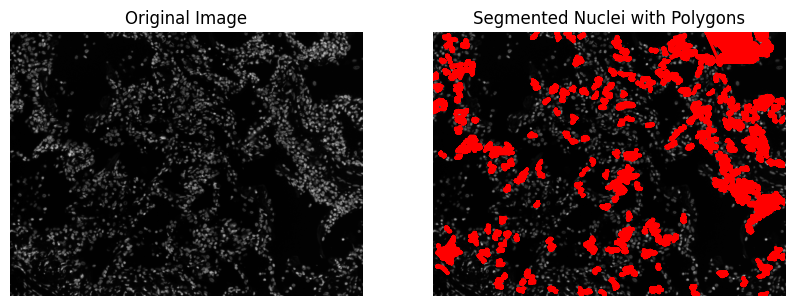

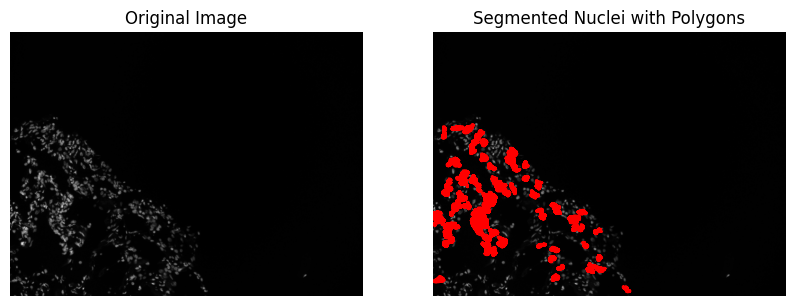

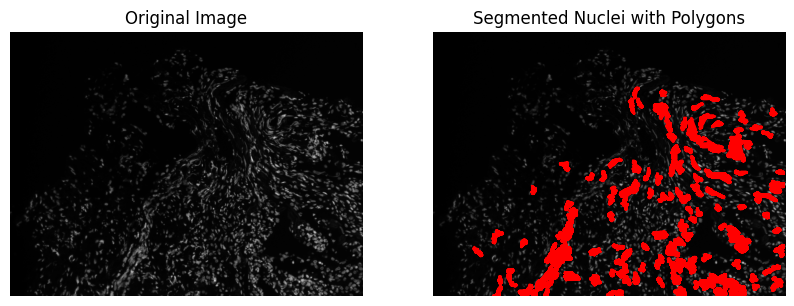

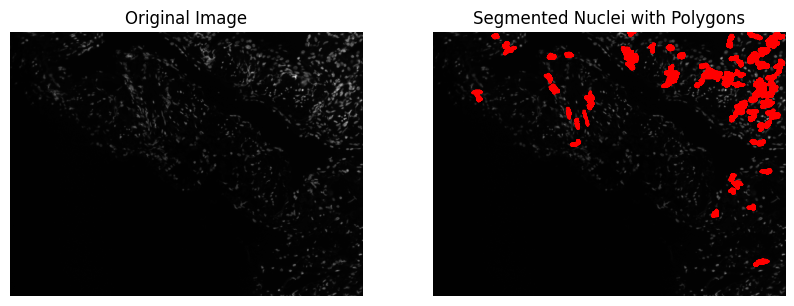

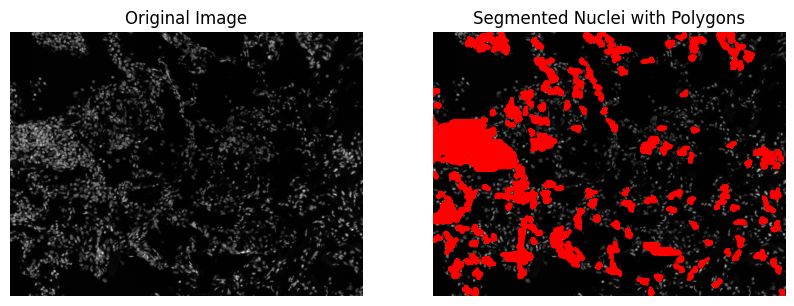

...

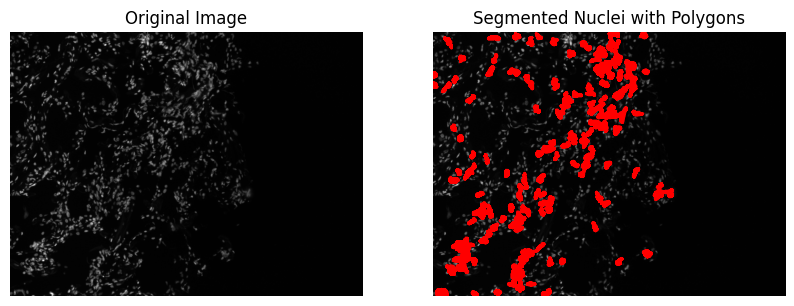

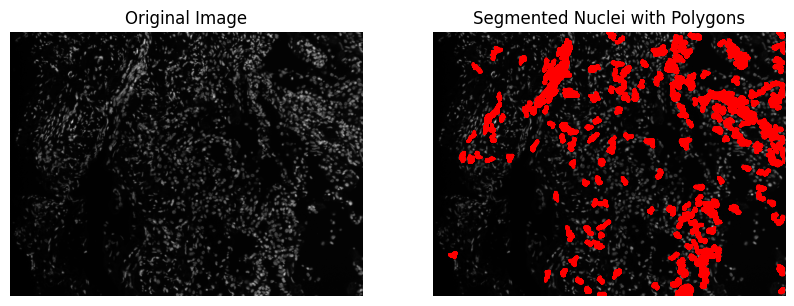

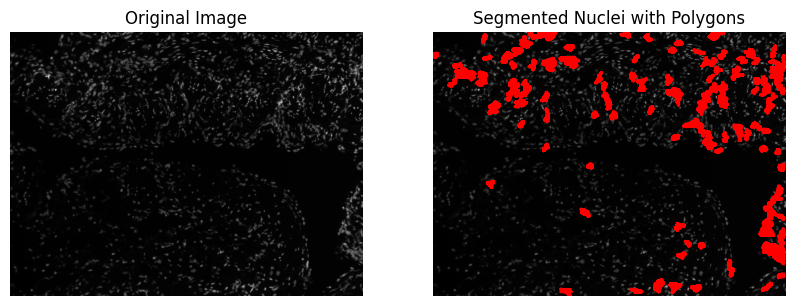

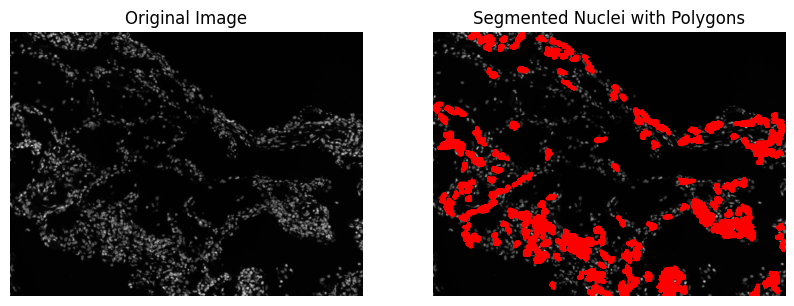

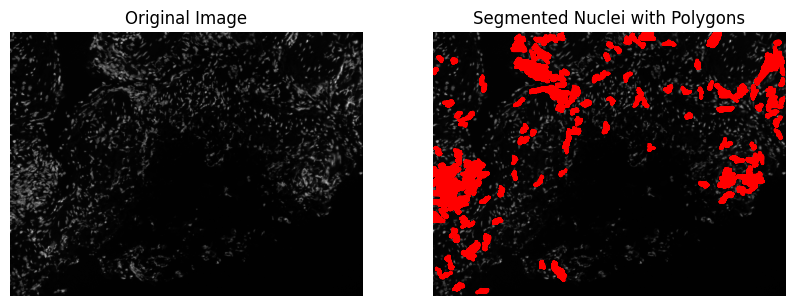

In [2]:
import os
import numpy as np
import matplotlib.pyplot as plt
from skimage.io import imread
from skimage.filters import threshold_otsu
from skimage.segmentation import watershed
from skimage.measure import regionprops
from skimage.morphology import remove_small_objects
from skimage.draw import polygon_perimeter
from scipy import ndimage as ndi  

# Load the images as grayscale from kaggle input directory
def load_images(filepaths):
    images = [imread(fp, as_gray=True) for fp in filepaths]  
    return images
# I have no used any pre-processing term
def preprocess_images(images):
    return images

# Segment nuclei using watershed segmentation
def segment_nuclei(images):
    segmented_nuclei = []
    for img in images:
        # Thresholding
        thresh = threshold_otsu(img)
        binary = img > thresh

        # Remove small objects
        binary = remove_small_objects(binary, min_size=100)

        # Apply watershed segmentation
        distance = ndi.distance_transform_edt(binary)
        markers = ndi.label(binary)[0]
        labels = watershed(-distance, markers, mask=binary)

        # Remove background label
        labels = labels - 1
        labels[labels == -1] = 0

        segmented_nuclei.append(labels)

    return segmented_nuclei

# Draw polygons around nuclei
def draw_polygons(images, labels):
    for img, lbl in zip(images, labels):
        plt.figure(figsize=(10, 5))
        
        plt.subplot(1, 2, 1)
        plt.imshow(img, cmap='gray')
        plt.title('Original Image')
        plt.axis('off')
        plt.subplot(1, 2, 2)
        #plt.imshow(img, cmap='viridis')
        
        plt.imshow(img, cmap='gray')
        
        for region in regionprops(lbl):
            perimeter = region.perimeter
            coords = region.coords
            
            rows = coords[:, 0]  # Rows (y-coordinates)
            cols = coords[:, 1]  # Columns (x-coordinates)

            polygon = polygon_perimeter(rows, cols, img.shape)
            plt.plot(polygon[1], polygon[0], color='r', linewidth=2)
            
        plt.title('Segmented Nuclei with Polygons')
        plt.axis('off')
        plt.show()


# mmmain function
def main():
    
    image_path = "/kaggle/input/orginal"
    jpgs = os.listdir(image_path)
    image_filepaths = [os.path.join(image_path, jpg) for jpg in jpgs]

    # Load images
    images = load_images(image_filepaths)

    # preprocess the images 
    preprocessed_images = preprocess_images(images)

    # Segment nuclei using watershed segmentation
    segmented_nuclei = segment_nuclei(preprocessed_images)

    # draw polygons around segmented nuclei
    draw_polygons(images, segmented_nuclei)

if __name__ == "__main__":
    main()


# Using the StartDist2D method 

2024-05-14 08:45:46.611666: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:9261] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2024-05-14 08:45:46.611772: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:607] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2024-05-14 08:45:46.791074: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1515] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
tf.py (73): Using Keras version 3+ with Tensorflow below version 2.16 might work, but has not been tested.


Found model '2D_versatile_fluo' for 'StarDist2D'.
5320433/5320433 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step
Loading network weights from 'weights_best.h5'.
Loading thresholds from 'thresholds.json'.
Using default values: prob_thresh=0.479071, nms_thresh=0.3.


I0000 00:00:1715676371.640216     141 device_compiler.h:186] Compiled cluster using XLA!  This line is logged at most once for the lifetime of the process.


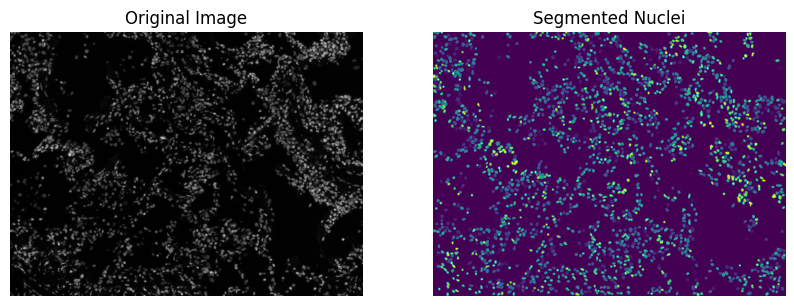

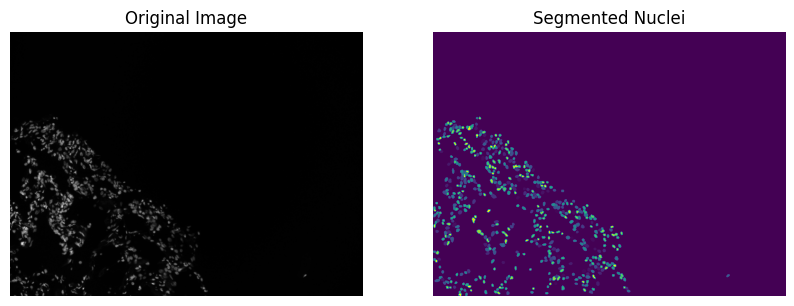

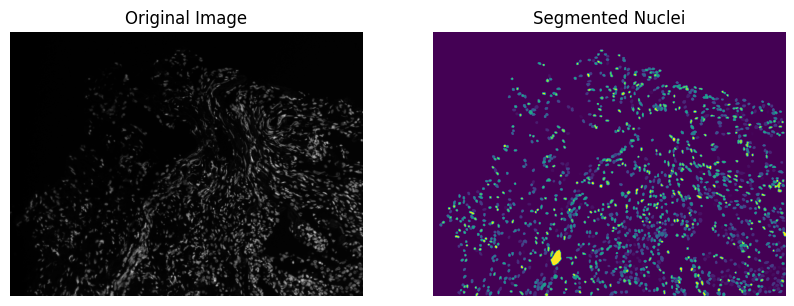

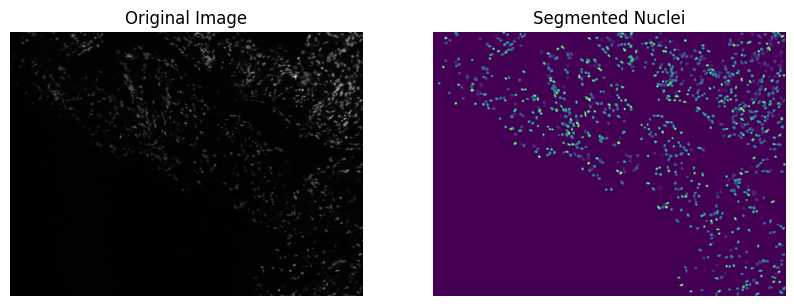

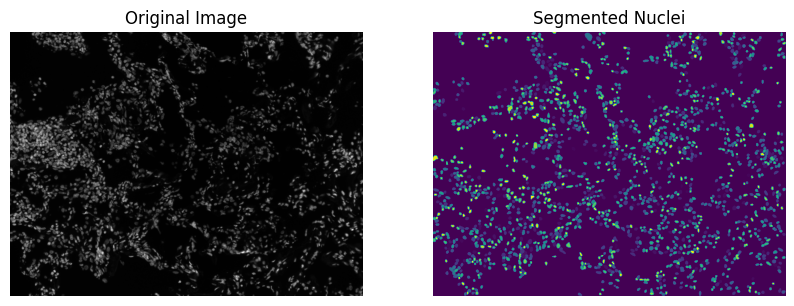

...

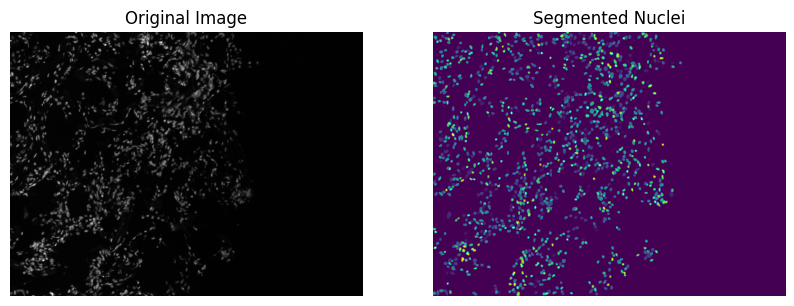

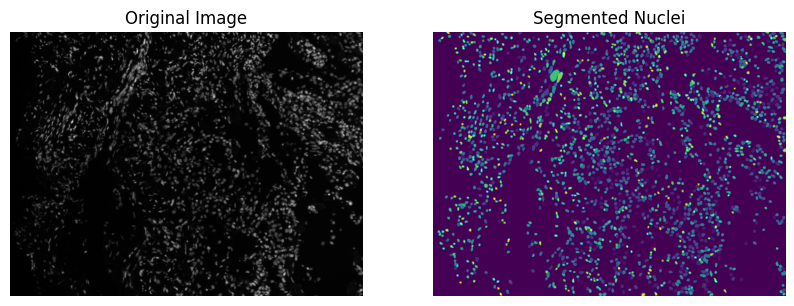

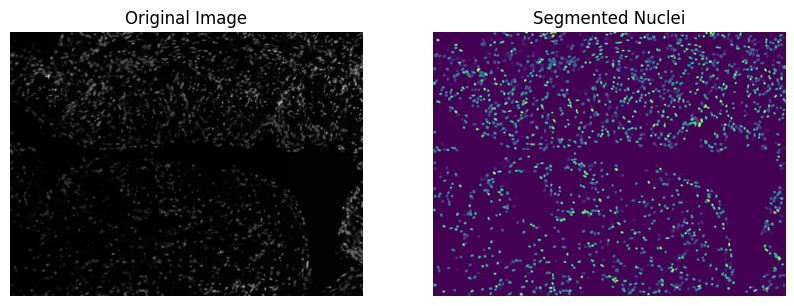

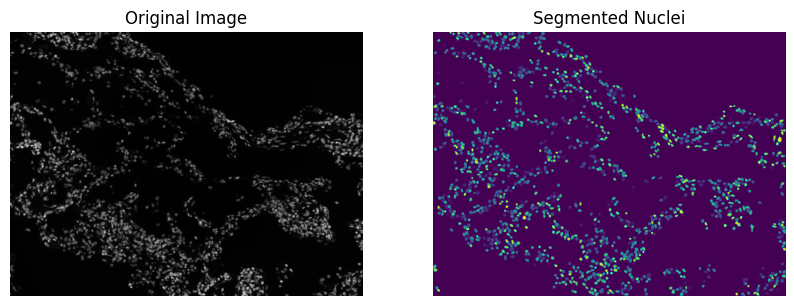

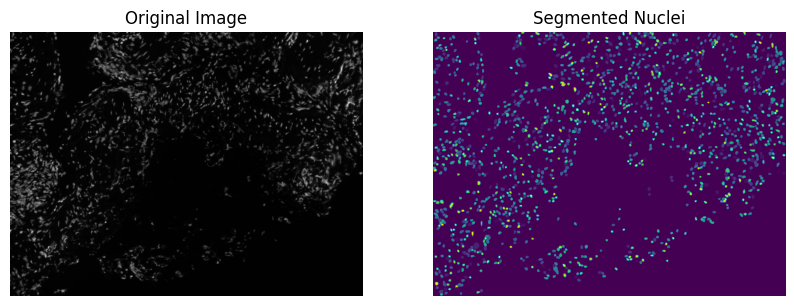

In [3]:
import os
import numpy as np
import matplotlib.pyplot as plt
from skimage.io import imread
from stardist.models import StarDist2D
from stardist import star_dist
from csbdeep.utils import normalize
from skimage.segmentation import relabel_sequential

# Load the images from my directory
def load_images(filepaths):
    images = [imread(fp) for fp in filepaths]
    return images

# Preprocess images
def preprocess_images(images):
    normalized_images = [normalize(img, 1, 99.8, axis=(0,1)) for img in images]
    return normalized_images

# Segment nuclei using StarDist

def segment_nuclei(images, model):
    labels = []
    for img in images:
        predicted_instances = model.predict_instances(img.astype(np.float32))[0]
        labels.append(predicted_instances)
    return labels


# Display segmented nuclei
def display_segmentation(images, labels):
    for img, lbl in zip(images, labels):
        lbl = lbl.astype(np.uint16)
        plt.figure(figsize=(10, 5))
        plt.subplot(1, 2, 1)
        plt.imshow(img, cmap='gray')
        plt.title('Original Image')
        plt.axis('off')
        plt.subplot(1, 2, 2)
        plt.imshow(lbl, cmap='viridis')
        plt.title('Segmented Nuclei')
        plt.axis('off')
        plt.show()

def main():
    
    image_path = "/kaggle/input/orginal"
    jpgs = os.listdir(image_path)
    image_filepaths = [os.path.join(image_path, jpg) for jpg in jpgs]

    images = load_images(image_filepaths)
    preprocessed_images = preprocess_images(images)
    model = StarDist2D.from_pretrained('2D_versatile_fluo')
    segmented_nuclei = segment_nuclei(preprocessed_images, model)

    display_segmentation(images, segmented_nuclei)

if __name__ == "__main__":
    main()


# Using watershed method and draw circle around neuclei

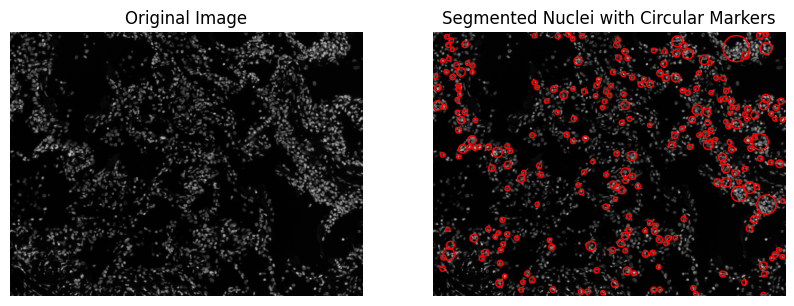

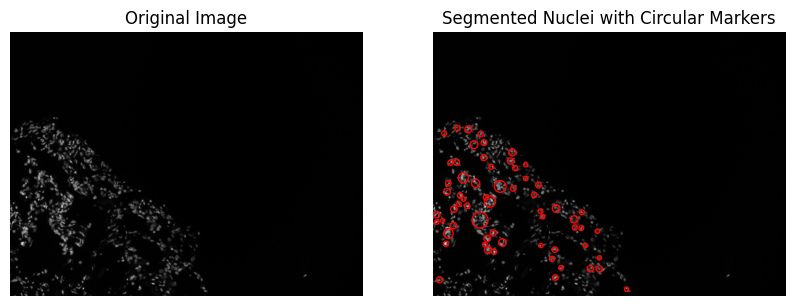

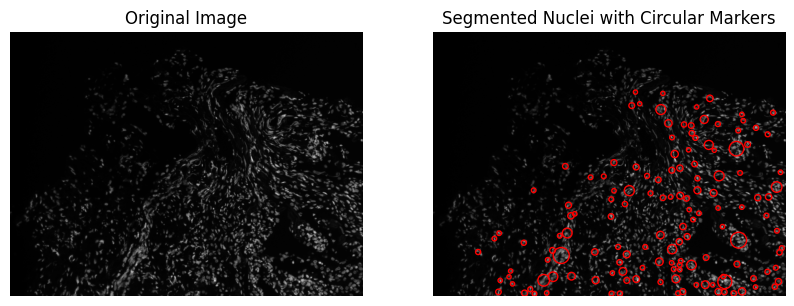

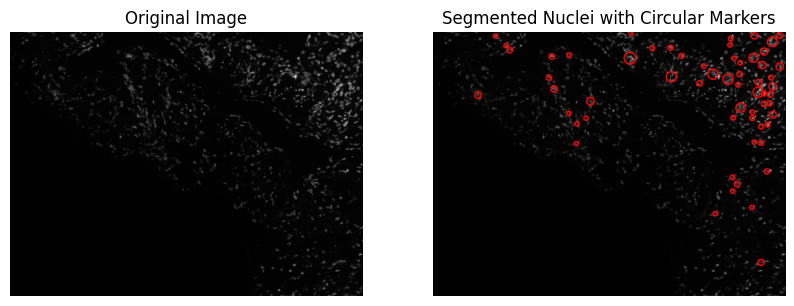

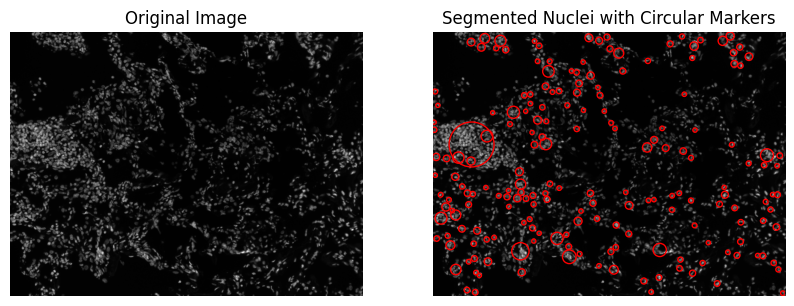

...

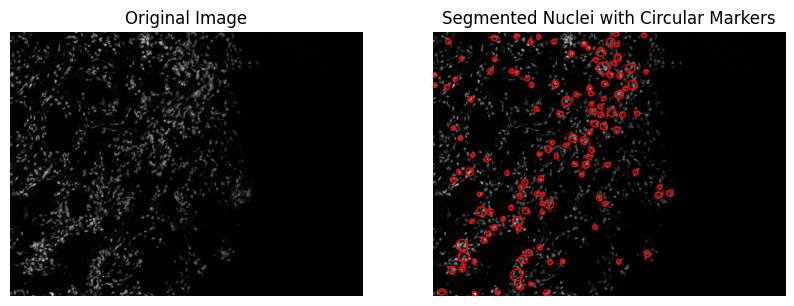

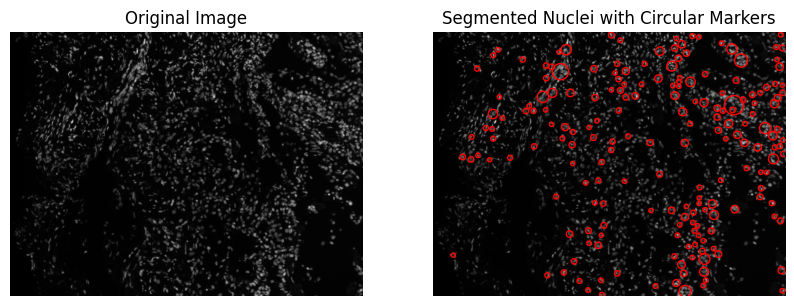

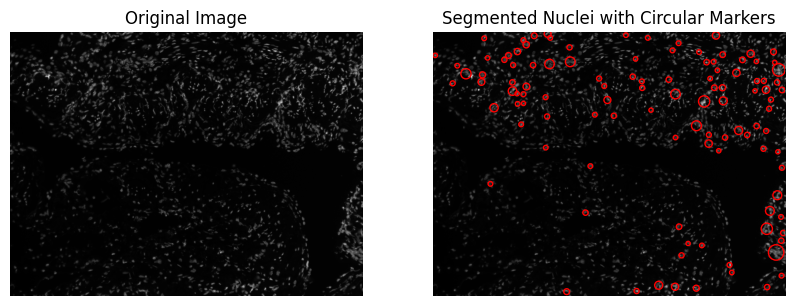

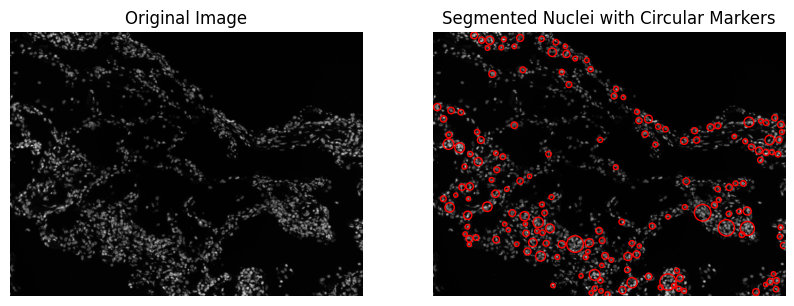

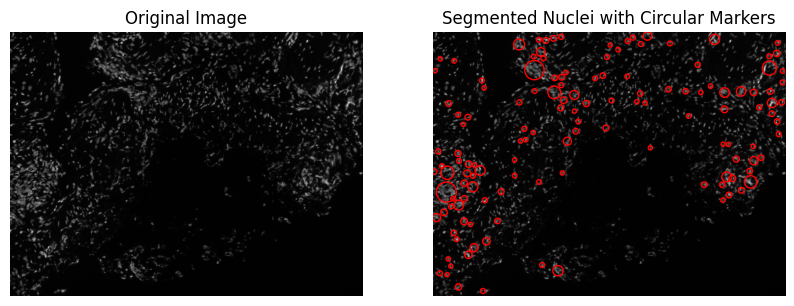

In [18]:
import os
import numpy as np
import matplotlib.pyplot as plt
from skimage.io import imread
from skimage.filters import threshold_otsu
from skimage.segmentation import watershed
from skimage.measure import regionprops
from skimage.morphology import remove_small_objects
from scipy import ndimage as ndi

def load_images(filepaths):
    images = [imread(fp, as_gray=True) for fp in filepaths]
    return images

# Not used any pre-processing method
def preprocess_images(images):
    return images

def segment_nuclei(images):
    segmented_nuclei = []
    for img in images:
        thresh = threshold_otsu(img)
        binary = img > thresh

        binary = remove_small_objects(binary, min_size=100)

        distance = ndi.distance_transform_edt(binary)
        markers = ndi.label(binary)[0]
        labels = watershed(-distance, markers, mask=binary)

        labels = labels - 1
        labels[labels == -1] = 0

        segmented_nuclei.append(labels)

    return segmented_nuclei

# Draw circular markers around nuclei
def draw_circular_markers(images, labels):
    for img, lbl in zip(images, labels):
        plt.figure(figsize=(10, 5))
        
        plt.subplot(1, 2, 1)
        plt.imshow(img, cmap='gray')
        plt.title('Original Image')
        plt.axis('off')
        plt.subplot(1, 2, 2)
        plt.imshow(img, cmap='gray')
        
        for region in regionprops(lbl):
            y, x = region.centroid
            radius = region.equivalent_diameter / 2.
            circle = plt.Circle((x, y), radius, color='r', fill=False)
            plt.gca().add_patch(circle)
            
        plt.title('Segmented Nuclei with Circular Markers')
        plt.axis('off')
        plt.show()

def main():
    image_path = "/kaggle/input/orginal"
    jpgs = os.listdir(image_path)
    image_filepaths = [os.path.join(image_path, jpg) for jpg in jpgs]

    images = load_images(image_filepaths)

    preprocessed_images = preprocess_images(images)

    segmented_nuclei = segment_nuclei(preprocessed_images)
    draw_circular_markers(images, segmented_nuclei)

if __name__ == "__main__":
    main()


# Load images and create mask file for each image and save in the kaggle working directory

In [29]:
!pip install tifffile


In [2]:
import os
from skimage.io import imread, imsave
from skimage.filters import threshold_otsu
from skimage.morphology import binary_closing, disk

image_dir = "/kaggle/input/orginal/"
output_dir = "/kaggle/working/"

image_files = os.listdir(image_dir)

# Iterate through each image file
for image_file in image_files:
    image_path = os.path.join(image_dir, image_file)
    image = imread(image_path, as_gray=True)

    threshold = threshold_otsu(image)
    binary_mask = image > threshold

    # Perform morphological closing to fill in gaps and smooth the mask
    binary_mask = binary_closing(binary_mask, disk(3))
    
    mask_file = os.path.splitext(image_file)[0] + "_mask.tif"
    mask_path = os.path.join(output_dir, mask_file)
    imsave(mask_path, binary_mask.astype(int) * 255)

    print(f"Mask saved for: {image_file}")


/tmp/ipykernel_34/2421158567.py:30: UserWarning: /kaggle/working/Muc1_Ecad_SPC_x20_2_XY10_00014_CH3_mask.tif is a low contrast image
  imsave(mask_path, binary_mask.astype(int) * 255)  # Save as uint8 (0 or 255)
/tmp/ipykernel_34/2421158567.py:30: UserWarning: /kaggle/working/Muc1_Ecad_SPC_x20_2_XY10_00007_CH3_mask.tif is a low contrast image
  imsave(mask_path, binary_mask.astype(int) * 255)  # Save as uint8 (0 or 255)
/tmp/ipykernel_34/2421158567.py:30: UserWarning: /kaggle/working/Muc1_Ecad_SPC_x20_2_XY10_00001_CH3_mask.tif is a low contrast image
  imsave(mask_path, binary_mask.astype(int) * 255)  # Save as uint8 (0 or 255)
/tmp/ipykernel_34/2421158567.py:30: UserWarning: /kaggle/working/Muc1_Ecad_SPC_x20_2_XY10_00026_CH3_mask.tif is a low contrast image
  imsave(mask_path, binary_mask.astype(int) * 255)  # Save as uint8 (0 or 255)


Mask saved for: Muc1_Ecad_SPC_x20_2_XY10_00014_CH3.tif
Mask saved for: Muc1_Ecad_SPC_x20_2_XY10_00007_CH3.tif
Mask saved for: Muc1_Ecad_SPC_x20_2_XY10_00001_CH3.tif
Mask saved for: Muc1_Ecad_SPC_x20_2_XY10_00026_CH3.tif


/tmp/ipykernel_34/2421158567.py:30: UserWarning: /kaggle/working/Muc1_Ecad_SPC_x20_2_XY10_00017_CH3_mask.tif is a low contrast image
  imsave(mask_path, binary_mask.astype(int) * 255)  # Save as uint8 (0 or 255)
/tmp/ipykernel_34/2421158567.py:30: UserWarning: /kaggle/working/Muc1_Ecad_SPC_x20_2_XY10_00016_CH3_mask.tif is a low contrast image
  imsave(mask_path, binary_mask.astype(int) * 255)  # Save as uint8 (0 or 255)
/tmp/ipykernel_34/2421158567.py:30: UserWarning: /kaggle/working/Muc1_Ecad_SPC_x20_2_XY10_00022_CH3_mask.tif is a low contrast image
  imsave(mask_path, binary_mask.astype(int) * 255)  # Save as uint8 (0 or 255)
/tmp/ipykernel_34/2421158567.py:30: UserWarning: /kaggle/working/Muc1_Ecad_SPC_x20_2_XY10_00034_CH3_mask.tif is a low contrast image
  imsave(mask_path, binary_mask.astype(int) * 255)  # Save as uint8 (0 or 255)


Mask saved for: Muc1_Ecad_SPC_x20_2_XY10_00017_CH3.tif
Mask saved for: Muc1_Ecad_SPC_x20_2_XY10_00016_CH3.tif
Mask saved for: Muc1_Ecad_SPC_x20_2_XY10_00022_CH3.tif
Mask saved for: Muc1_Ecad_SPC_x20_2_XY10_00034_CH3.tif


/tmp/ipykernel_34/2421158567.py:30: UserWarning: /kaggle/working/Muc1_Ecad_SPC_x20_2_XY10_00028_CH3_mask.tif is a low contrast image
  imsave(mask_path, binary_mask.astype(int) * 255)  # Save as uint8 (0 or 255)
/tmp/ipykernel_34/2421158567.py:30: UserWarning: /kaggle/working/Muc1_Ecad_SPC_x20_2_XY10_00040_CH3_mask.tif is a low contrast image
  imsave(mask_path, binary_mask.astype(int) * 255)  # Save as uint8 (0 or 255)
/tmp/ipykernel_34/2421158567.py:30: UserWarning: /kaggle/working/Muc1_Ecad_SPC_x20_2_XY10_00039_CH3_mask.tif is a low contrast image
  imsave(mask_path, binary_mask.astype(int) * 255)  # Save as uint8 (0 or 255)
/tmp/ipykernel_34/2421158567.py:30: UserWarning: /kaggle/working/Muc1_Ecad_SPC_x20_2_XY10_00015_CH3_mask.tif is a low contrast image
  imsave(mask_path, binary_mask.astype(int) * 255)  # Save as uint8 (0 or 255)


Mask saved for: Muc1_Ecad_SPC_x20_2_XY10_00028_CH3.tif
Mask saved for: Muc1_Ecad_SPC_x20_2_XY10_00040_CH3.tif
Mask saved for: Muc1_Ecad_SPC_x20_2_XY10_00039_CH3.tif
Mask saved for: Muc1_Ecad_SPC_x20_2_XY10_00015_CH3.tif


/tmp/ipykernel_34/2421158567.py:30: UserWarning: /kaggle/working/Muc1_Ecad_SPC_x20_2_XY10_00021_CH3_mask.tif is a low contrast image
  imsave(mask_path, binary_mask.astype(int) * 255)  # Save as uint8 (0 or 255)
/tmp/ipykernel_34/2421158567.py:30: UserWarning: /kaggle/working/Muc1_Ecad_SPC_x20_2_XY10_00011_CH3_mask.tif is a low contrast image
  imsave(mask_path, binary_mask.astype(int) * 255)  # Save as uint8 (0 or 255)
/tmp/ipykernel_34/2421158567.py:30: UserWarning: /kaggle/working/Muc1_Ecad_SPC_x20_2_XY10_00008_CH3_mask.tif is a low contrast image
  imsave(mask_path, binary_mask.astype(int) * 255)  # Save as uint8 (0 or 255)


Mask saved for: Muc1_Ecad_SPC_x20_2_XY10_00021_CH3.tif
Mask saved for: Muc1_Ecad_SPC_x20_2_XY10_00011_CH3.tif
Mask saved for: Muc1_Ecad_SPC_x20_2_XY10_00008_CH3.tif


/tmp/ipykernel_34/2421158567.py:30: UserWarning: /kaggle/working/Muc1_Ecad_SPC_x20_2_XY10_00029_CH3_mask.tif is a low contrast image
  imsave(mask_path, binary_mask.astype(int) * 255)  # Save as uint8 (0 or 255)
/tmp/ipykernel_34/2421158567.py:30: UserWarning: /kaggle/working/Muc1_Ecad_SPC_x20_2_XY10_00023_CH3_mask.tif is a low contrast image
  imsave(mask_path, binary_mask.astype(int) * 255)  # Save as uint8 (0 or 255)
/tmp/ipykernel_34/2421158567.py:30: UserWarning: /kaggle/working/Muc1_Ecad_SPC_x20_2_XY10_00031_CH3_mask.tif is a low contrast image
  imsave(mask_path, binary_mask.astype(int) * 255)  # Save as uint8 (0 or 255)
/tmp/ipykernel_34/2421158567.py:30: UserWarning: /kaggle/working/Muc1_Ecad_SPC_x20_2_XY10_00030_CH3_mask.tif is a low contrast image
  imsave(mask_path, binary_mask.astype(int) * 255)  # Save as uint8 (0 or 255)


Mask saved for: Muc1_Ecad_SPC_x20_2_XY10_00029_CH3.tif
Mask saved for: Muc1_Ecad_SPC_x20_2_XY10_00023_CH3.tif
Mask saved for: Muc1_Ecad_SPC_x20_2_XY10_00031_CH3.tif
Mask saved for: Muc1_Ecad_SPC_x20_2_XY10_00030_CH3.tif


/tmp/ipykernel_34/2421158567.py:30: UserWarning: /kaggle/working/Muc1_Ecad_SPC_x20_2_XY10_00002_CH3_mask.tif is a low contrast image
  imsave(mask_path, binary_mask.astype(int) * 255)  # Save as uint8 (0 or 255)
/tmp/ipykernel_34/2421158567.py:30: UserWarning: /kaggle/working/Muc1_Ecad_SPC_x20_2_XY10_00013_CH3_mask.tif is a low contrast image
  imsave(mask_path, binary_mask.astype(int) * 255)  # Save as uint8 (0 or 255)
/tmp/ipykernel_34/2421158567.py:30: UserWarning: /kaggle/working/Muc1_Ecad_SPC_x20_2_XY10_00020_CH3_mask.tif is a low contrast image
  imsave(mask_path, binary_mask.astype(int) * 255)  # Save as uint8 (0 or 255)


Mask saved for: Muc1_Ecad_SPC_x20_2_XY10_00002_CH3.tif
Mask saved for: Muc1_Ecad_SPC_x20_2_XY10_00013_CH3.tif
Mask saved for: Muc1_Ecad_SPC_x20_2_XY10_00020_CH3.tif


/tmp/ipykernel_34/2421158567.py:30: UserWarning: /kaggle/working/Muc1_Ecad_SPC_x20_2_XY10_00010_CH3_mask.tif is a low contrast image
  imsave(mask_path, binary_mask.astype(int) * 255)  # Save as uint8 (0 or 255)
/tmp/ipykernel_34/2421158567.py:30: UserWarning: /kaggle/working/Muc1_Ecad_SPC_x20_2_XY10_00019_CH3_mask.tif is a low contrast image
  imsave(mask_path, binary_mask.astype(int) * 255)  # Save as uint8 (0 or 255)
/tmp/ipykernel_34/2421158567.py:30: UserWarning: /kaggle/working/Muc1_Ecad_SPC_x20_2_XY10_00012_CH3_mask.tif is a low contrast image
  imsave(mask_path, binary_mask.astype(int) * 255)  # Save as uint8 (0 or 255)
/tmp/ipykernel_34/2421158567.py:30: UserWarning: /kaggle/working/Muc1_Ecad_SPC_x20_2_XY10_00027_CH3_mask.tif is a low contrast image
  imsave(mask_path, binary_mask.astype(int) * 255)  # Save as uint8 (0 or 255)


Mask saved for: Muc1_Ecad_SPC_x20_2_XY10_00010_CH3.tif
Mask saved for: Muc1_Ecad_SPC_x20_2_XY10_00019_CH3.tif
Mask saved for: Muc1_Ecad_SPC_x20_2_XY10_00012_CH3.tif
Mask saved for: Muc1_Ecad_SPC_x20_2_XY10_00027_CH3.tif
Mask saved for: Muc1_Ecad_SPC_x20_2_XY10_00009_CH3.tif
Mask saved for: Muc1_Ecad_SPC_x20_2_XY10_00033_CH3.tif


/tmp/ipykernel_34/2421158567.py:30: UserWarning: /kaggle/working/Muc1_Ecad_SPC_x20_2_XY10_00009_CH3_mask.tif is a low contrast image
  imsave(mask_path, binary_mask.astype(int) * 255)  # Save as uint8 (0 or 255)
/tmp/ipykernel_34/2421158567.py:30: UserWarning: /kaggle/working/Muc1_Ecad_SPC_x20_2_XY10_00033_CH3_mask.tif is a low contrast image
  imsave(mask_path, binary_mask.astype(int) * 255)  # Save as uint8 (0 or 255)


# create a custom u-net CNN model and predict the neuclei segmentation.

28
28
Epoch 1/20
6/6 ━━━━━━━━━━━━━━━━━━━━ 22s 2s/step - accuracy: 0.5057 - loss: 0.6928 - val_accuracy: 0.5285 - val_loss: 0.6902
Epoch 2/20
6/6 ━━━━━━━━━━━━━━━━━━━━ 2s 250ms/step - accuracy: 0.5103 - loss: 0.6895 - val_accuracy: 0.5285 - val_loss: 0.6872
Epoch 3/20
6/6 ━━━━━━━━━━━━━━━━━━━━ 2s 252ms/step - accuracy: 0.5655 - loss: 0.6865 - val_accuracy: 0.5285 - val_loss: 0.6842
Epoch 4/20
6/6 ━━━━━━━━━━━━━━━━━━━━ 2s 253ms/step - accuracy: 0.5287 - loss: 0.6835 - val_accuracy: 0.5285 - val_loss: 0.6812
Epoch 5/20
6/6 ━━━━━━━━━━━━━━━━━━━━ 2s 253ms/step - accuracy: 0.5469 - loss: 0.6806 - val_accuracy: 0.5285 - val_loss: 0.6783
Epoch 6/20
6/6 ━━━━━━━━━━━━━━━━━━━━ 2s 254ms/step - accuracy: 0.5250 - loss: 0.6776 - val_accuracy: 0.5285 - val_loss: 0.6753
Epoch 7/20
6/6 ━━━━━━━━━━━━━━━━━━━━ 2s 254ms/step - accuracy: 0.5415 - loss: 0.6747 - val_accuracy: 0.5285 - val_loss: 0.6724
Epoch 8/20
6/6 ━━━━━━━━━━━━━━━━━━━━ 2s 255ms/step - accuracy: 0.5091 - loss: 0.6718 - val_accuracy: 0.5285 - val_l

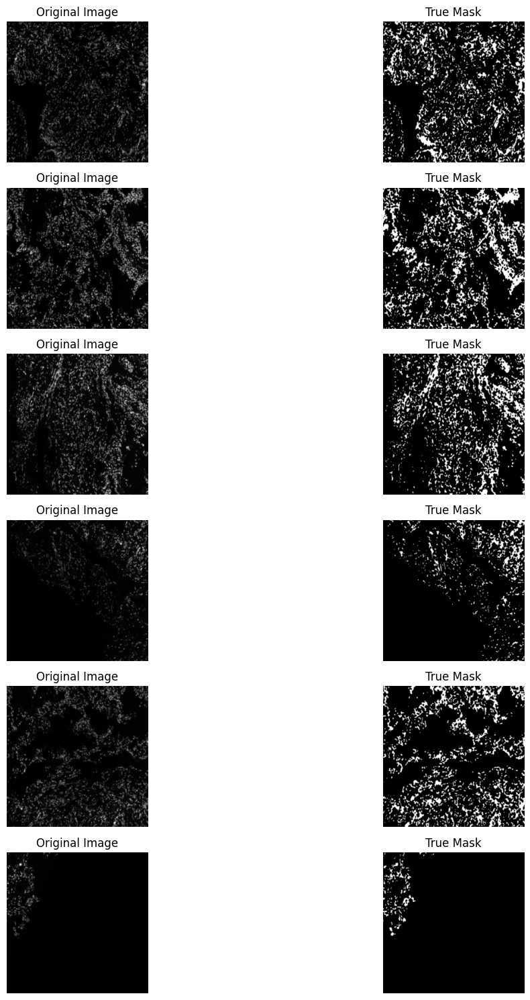

In [27]:
import os
import numpy as np
import matplotlib.pyplot as plt
from skimage.io import imread
from skimage.transform import resize
from sklearn.model_selection import train_test_split
import tensorflow as tf
from tensorflow.keras import layers, models

image_dir = "/kaggle/input/orginal/"
mask_dir = "/kaggle/working/"

image_files = os.listdir(image_dir)

# Function to load images and masks
def load_data(image_files, image_dir, mask_dir):
    images = []
    masks = []
    for image_file in image_files:
        image_path = os.path.join(image_dir, image_file)
        mask_file = os.path.splitext(image_file)[0] + "_mask.tif"
        mask_path = os.path.join(mask_dir, mask_file)
        
        # Load and resize image
        image = imread(image_path, as_gray=True)
        image = resize(image, (256, 256))
        
        # Load and resize mask
        mask = imread(mask_path, as_gray=True)
        mask = resize(mask, (256, 256))
        
        images.append(image)
        masks.append(mask)
    
    return images, masks


images, masks = load_data(image_files, image_dir, mask_dir)
print(len(images))
print(len(masks))

# Convert lists to numpy arrays
images = np.array(images)
masks = np.array(masks)

# Adding channel dimension to masks
masks = masks[..., np.newaxis]

# Split data into training and validation sets
train_images, val_images, train_masks, val_masks = train_test_split(images, masks, test_size=0.2)

# custom U-Net model
def unet_model(input_shape=(256, 256, 1)):
    # Model architecture
    inputs = layers.Input(input_shape)
    conv1 = layers.Conv2D(64, 3, activation='relu', padding='same')(inputs)
    conv1 = layers.Conv2D(64, 3, activation='relu', padding='same')(conv1)
    pool1 = layers.MaxPooling2D(pool_size=(2, 2))(conv1)

    conv2 = layers.Conv2D(128, 3, activation='relu', padding='same')(pool1)
    conv2 = layers.Conv2D(128, 3, activation='relu', padding='same')(conv2)
    pool2 = layers.MaxPooling2D(pool_size=(2, 2))(conv2)

    conv3 = layers.Conv2D(256, 3, activation='relu', padding='same')(pool2)
    conv3 = layers.Conv2D(256, 3, activation='relu', padding='same')(conv3)
    pool3 = layers.MaxPooling2D(pool_size=(2, 2))(conv3)

    conv4 = layers.Conv2D(512, 3, activation='relu', padding='same')(pool3)
    conv4 = layers.Conv2D(512, 3, activation='relu', padding='same')(conv4)
    drop4 = layers.Dropout(0.5)(conv4)
    pool4 = layers.MaxPooling2D(pool_size=(2, 2))(drop4)

    # Bottleneck layer
    conv5 = layers.Conv2D(1024, 3, activation='relu', padding='same')(pool4)
    conv5 = layers.Conv2D(1024, 3, activation='relu', padding='same')(conv5)
    drop5 = layers.Dropout(0.5)(conv5)

    # Decoder
    up6 = layers.Conv2D(512, 2, activation='relu', padding='same')(layers.UpSampling2D(size=(2, 2))(drop5))
    merge6 = layers.concatenate([drop4, up6], axis=3)
    conv6 = layers.Conv2D(512, 3, activation='relu', padding='same')(merge6)
    conv6 = layers.Conv2D(512, 3, activation='relu', padding='same')(conv6)

    up7 = layers.Conv2D(256, 2, activation='relu', padding='same')(layers.UpSampling2D(size=(2, 2))(conv6))
    merge7 = layers.concatenate([conv3, up7], axis=3)
    conv7 = layers.Conv2D(256, 3, activation='relu', padding='same')(merge7)
    conv7 = layers.Conv2D(256, 3, activation='relu', padding='same')(conv7)

    up8 = layers.Conv2D(128, 2, activation='relu', padding='same')(layers.UpSampling2D(size=(2, 2))(conv7))
    merge8 = layers.concatenate([conv2, up8], axis=3)
    conv8 = layers.Conv2D(128, 3, activation='relu', padding='same')(merge8)
    conv8 = layers.Conv2D(128, 3, activation='relu', padding='same')(conv8)

    up9 = layers.Conv2D(64, 2, activation='relu', padding='same')(layers.UpSampling2D(size=(2, 2))(conv8))
    merge9 = layers.concatenate([conv1, up9], axis=3)
    conv9 = layers.Conv2D(64, 3, activation='relu', padding='same')(merge9)
    conv9 = layers.Conv2D(64, 3, activation='relu', padding='same')(conv9)
    conv9 = layers.Conv2D(2, 3, activation='relu', padding='same')(conv9)

    # Output layer
    outputs = layers.Conv2D(1, 1, activation='sigmoid')(conv9)

    return models.Model(inputs=[inputs], outputs=[outputs])
# Compile the model
model = unet_model()
model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])

# Train the model
history = model.fit(train_images, train_masks, validation_data=(val_images, val_masks), epochs=20, batch_size=4)



# Function to visualize predicted masks
def visualize_results(images, masks):
    num_samples = len(images)
    fig, axes = plt.subplots(num_samples, 2, figsize=(15, 15))
    
    for i in range(num_samples):
        axes[i, 0].imshow(images[i], cmap='gray')
        axes[i, 0].set_title('Original Image')
        axes[i, 0].axis('off')
        
        axes[i, 1].imshow(masks[i, ..., 0], cmap='gray')
        axes[i, 1].set_title('True Mask')
        axes[i, 1].axis('off')
        
    
    plt.tight_layout()
    plt.show()

# Predict masks for validation images
val_predictions = model.predict(val_images)

# Visualize results
visualize_results(val_images, val_masks)


create same CNN model and used data augmentation (to improve accuracy) and predict the neuclei.

28
28
Epoch 1/20
5/5 ━━━━━━━━━━━━━━━━━━━━ 21s 2s/step - accuracy: 0.3895 - loss: 0.5647 - val_accuracy: 0.5937 - val_loss: 2.3183e-12
Epoch 2/20
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step - accuracy: 0.5272 - loss: 5.5133e-12 - val_accuracy: 0.5937 - val_loss: 3.0666e-11
Epoch 3/20
5/5 ━━━━━━━━━━━━━━━━━━━━ 1s 267ms/step - accuracy: 0.5426 - loss: 4.2979e-09 - val_accuracy: 0.5937 - val_loss: 3.9443e-08
Epoch 4/20
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step - accuracy: 0.4668 - loss: 1.3786e-07 - val_accuracy: 0.5937 - val_loss: 9.1799e-08
Epoch 5/20
5/5 ━━━━━━━━━━━━━━━━━━━━ 1s 297ms/step - accuracy: 0.4956 - loss: 7.6772e-07 - val_accuracy: 0.5937 - val_loss: 1.6494e-06
Epoch 6/20
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step - accuracy: 0.5326 - loss: 4.7578e-06 - val_accuracy: 0.5937 - val_loss: 2.4486e-06
Epoch 7/20
5/5 ━━━━━━━━━━━━━━━━━━━━ 1s 268ms/step - accuracy: 0.5224 - loss: 9.2355e-06 - val_accuracy: 0.5937 - val_loss: 1.0164e-05
Epoch 8/20
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step - accuracy: 0.51

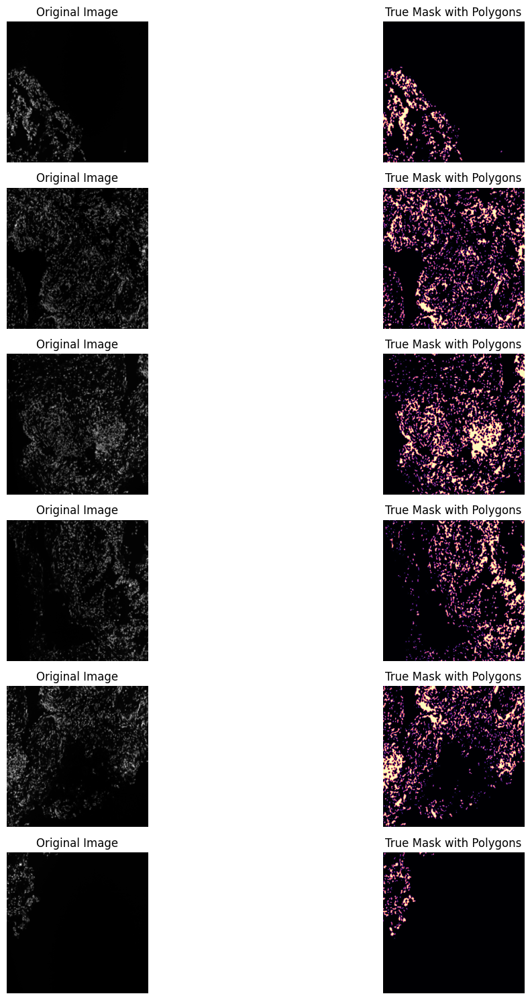

In [29]:
import os
import numpy as np
import matplotlib.pyplot as plt
from skimage.io import imread
from skimage.transform import resize
from sklearn.model_selection import train_test_split
import tensorflow as tf
from tensorflow.keras import layers, models

image_dir = "/kaggle/input/orginal/"
mask_dir = "/kaggle/working/"

image_files = os.listdir(image_dir)

# Load images and masks
def load_data(image_files, image_dir, mask_dir):
    images = []
    masks = []
    for image_file in image_files:
        image_path = os.path.join(image_dir, image_file)
        mask_file = os.path.splitext(image_file)[0] + "_mask.tif"
        mask_path = os.path.join(mask_dir, mask_file)
        
        # resize image
        image = imread(image_path, as_gray=True)
        image = resize(image, (256, 256))
        
        # resize mask
        mask = imread(mask_path, as_gray=True)
        mask = resize(mask, (256, 256))
        
        images.append(image)
        masks.append(mask)
    
    return images, masks

# Load images and masks
images, masks = load_data(image_files, image_dir, mask_dir)
print(len(images))
print(len(masks))

# Convert lists to numpy arrays
images = np.array(images)
masks = np.array(masks)

# Add channel dimension to masks
masks = masks[..., np.newaxis]

# Split data into train and val sets
train_images, val_images, train_masks, val_masks = train_test_split(images, masks, test_size=0.2)

# same model
def unet_model(input_shape=(256, 256, 1)):
    # Model architecture
    inputs = layers.Input(input_shape)
    conv1 = layers.Conv2D(64, 3, activation='relu', padding='same')(inputs)
    conv1 = layers.Conv2D(64, 3, activation='relu', padding='same')(conv1)
    pool1 = layers.MaxPooling2D(pool_size=(2, 2))(conv1)

    conv2 = layers.Conv2D(128, 3, activation='relu', padding='same')(pool1)
    conv2 = layers.Conv2D(128, 3, activation='relu', padding='same')(conv2)
    pool2 = layers.MaxPooling2D(pool_size=(2, 2))(conv2)

    conv3 = layers.Conv2D(256, 3, activation='relu', padding='same')(pool2)
    conv3 = layers.Conv2D(256, 3, activation='relu', padding='same')(conv3)
    pool3 = layers.MaxPooling2D(pool_size=(2, 2))(conv3)

    conv4 = layers.Conv2D(512, 3, activation='relu', padding='same')(pool3)
    conv4 = layers.Conv2D(512, 3, activation='relu', padding='same')(conv4)
    drop4 = layers.Dropout(0.5)(conv4)
    pool4 = layers.MaxPooling2D(pool_size=(2, 2))(drop4)

    # Bottleneck
    conv5 = layers.Conv2D(1024, 3, activation='relu', padding='same')(pool4)
    conv5 = layers.Conv2D(1024, 3, activation='relu', padding='same')(conv5)
    drop5 = layers.Dropout(0.5)(conv5)

    # Decoder
    up6 = layers.Conv2D(512, 2, activation='relu', padding='same')(layers.UpSampling2D(size=(2, 2))(drop5))
    merge6 = layers.concatenate([drop4, up6], axis=3)
    conv6 = layers.Conv2D(512, 3, activation='relu', padding='same')(merge6)
    conv6 = layers.Conv2D(512, 3, activation='relu', padding='same')(conv6)

    up7 = layers.Conv2D(256, 2, activation='relu', padding='same')(layers.UpSampling2D(size=(2, 2))(conv6))
    merge7 = layers.concatenate([conv3, up7], axis=3)
    conv7 = layers.Conv2D(256, 3, activation='relu', padding='same')(merge7)
    conv7 = layers.Conv2D(256, 3, activation='relu', padding='same')(conv7)

    up8 = layers.Conv2D(128, 2, activation='relu', padding='same')(layers.UpSampling2D(size=(2, 2))(conv7))
    merge8 = layers.concatenate([conv2, up8], axis=3)
    conv8 = layers.Conv2D(128, 3, activation='relu', padding='same')(merge8)
    conv8 = layers.Conv2D(128, 3, activation='relu', padding='same')(conv8)

    up9 = layers.Conv2D(64, 2, activation='relu', padding='same')(layers.UpSampling2D(size=(2, 2))(conv8))
    merge9 = layers.concatenate([conv1, up9], axis=3)
    conv9 = layers.Conv2D(64, 3, activation='relu', padding='same')(merge9)
    conv9 = layers.Conv2D(64, 3, activation='relu', padding='same')(conv9)
    conv9 = layers.Conv2D(2, 3, activation='relu', padding='same')(conv9)

    # Output
    outputs = layers.Conv2D(1, 1, activation='sigmoid')(conv9)

    return models.Model(inputs=[inputs], outputs=[outputs])

# Compile the model
model = unet_model()
model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])

# Train the model with data augmentation
from tensorflow.keras.preprocessing.image import ImageDataGenerator
datagen = ImageDataGenerator(
    rotation_range=15,
    width_shift_range=0.1,
    height_shift_range=0.1,
    shear_range=0.1,
    zoom_range=0.1,
    horizontal_flip=True,
    fill_mode='nearest'
)


epochs = 20
batch_size = 4

# Reshape input images and masks to include channel dimension
train_images = train_images[..., np.newaxis]
train_masks = train_masks[..., np.newaxis]
val_images = val_images[..., np.newaxis]
val_masks = val_masks[..., np.newaxis]

# Train the model with augmented data
history = model.fit(datagen.flow(train_images, train_masks, batch_size=batch_size),
                    steps_per_epoch=len(train_images) // batch_size,
                    validation_data=(val_images, val_masks),
                    epochs=epochs)



# Predict masks for validation images
val_predictions = model.predict(val_images)

import matplotlib.pyplot as plt
from skimage.draw import polygon
from skimage.segmentation import find_boundaries
from skimage.measure import label, regionprops

# Function to visualize predicted masks with polygons
def visualize_results_with_polygons(images, masks):
    num_samples = len(images)
    fig, axes = plt.subplots(num_samples, 2, figsize=(15, 15))
    
    for i in range(num_samples):
        axes[i, 0].imshow(images[i], cmap='gray')
        axes[i, 0].set_title('Original Image')
        axes[i, 0].axis('off')
        
        # Draw polygons on the true mask image
        draw_polygons(axes[i, 1], masks[i, ..., 0])
        axes[i, 1].set_title('True Mask with Polygons')
        
    
    plt.tight_layout()

# Function to draw polygons on the mask image
def draw_polygons(ax, mask):
    # Find boundaries of segmented nuclei
    boundaries = find_boundaries(mask, connectivity=mask.ndim)
    ax.imshow(mask, cmap='magma')

    # Draw polygons around segmented nuclei
    for region in regionprops(label(mask)):
        # Get coordinates of the region
        minr, minc, maxr, maxc = region.bbox
        coords = region.coords

        # Draw polygon around the region
        rr, cc = polygon(coords[:, 0], coords[:, 1], mask.shape)
        ax.plot(cc, rr, color='red', linewidth=2)

    # Show image with polygons
    ax.imshow(boundaries, cmap='magma', alpha=0.01)
    ax.axis('off')

visualize_results_with_polygons(val_images, val_masks)


